In [9]:
from sklearn.cluster import KMeans
from ast import literal_eval
from matplotlib.colors import ListedColormap, BoundaryNorm, Normalize
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import umap.umap_ as umap
import matplotlib

matplotlib.rc('font', family='Heiti TC')

In [3]:
# read data from csv
df = pd.read_csv('test.csv')
print(df.shape)
df.drop_duplicates(subset=['place_id','user_id'],inplace=True)
print(df.shape)
df = df[(df['n_tokens'] > 40) & (df['n_tokens'] < 800)]
print(df.shape)

(70320, 8)
(68828, 8)
(61780, 8)


In [5]:
# clustering
# convert embeddings to np.array metrix
df["embeddings"] = df.embeddings.apply(literal_eval).apply(np.array)
matrix = np.vstack(df.embeddings.values)

n_clusters = 10

kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=5)
kmeans.fit(matrix)
labels = kmeans.labels_
df["Cluster"] = labels


In [6]:
# create UMAP reducer
reducer = umap.UMAP(n_neighbors=100,min_dist=0.1, n_components=3, metric='cosine')
data_umap = reducer.fit_transform(matrix)
df['umap_1'] = data_umap[:, 0]
df['umap_2'] = data_umap[:, 1]
df['umap_3'] = data_umap[:, 2]

In [8]:
colors = plt.cm.tab10(np.linspace(0, 1, n_clusters))
cmap = ListedColormap(colors)
norm = BoundaryNorm(np.arange(-0.5, n_clusters + 0.5, 1), cmap.N)

mask = df['name'] == "數寄屋 辻葉 ゆず塩鷄白湯らーめん專門店"

scatter = plt.scatter('umap_1', 'umap_2', 'umap_3', s=1, c=labels, cmap=cmap, data=df,
                        norm=norm, alpha=0.5,label='')
plt.scatter(data_umap[mask, 0], data_umap[mask, 1], data_umap[mask, 2],
             s=5, color='black',alpha=1, label='數寄屋 辻葉 ゆず塩鷄白湯らーめん專門店')
plt.colorbar(scatter, ticks=np.arange(n_clusters), label='Cluster ID')  # Adjust colorbar to show discrete values
plt.title('UMAP projection of embeddings, colored by cluster')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.legend()

TypeError: scatter() got multiple values for argument 's'

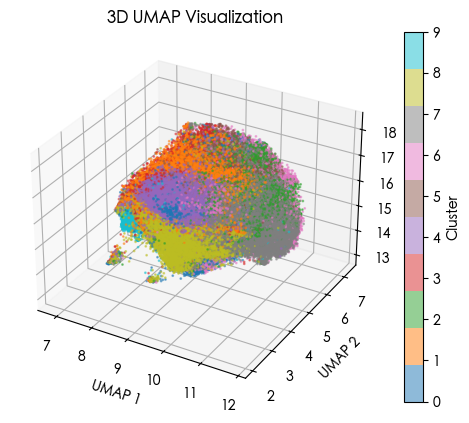

In [12]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df['umap_1'], df['umap_2'], df['umap_3'], c=df['Cluster'], cmap='tab10',
                    alpha=0.5,s=1)
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_zlabel('UMAP 3')
ax.set_title('3D UMAP Visualization')

fig.colorbar(scatter, ax=ax, label='Cluster')

In [25]:
import plotly.express as px
import nbformat
fig = px.scatter_3d(df, x='umap_1', y='umap_2', z='umap_3',
                    color='Cluster',  # Color points by cluster
                    color_continuous_scale=px.colors.qualitative.T10,  # Color scheme
                    labels={'umap_1': 'UMAP 1', 'umap_2': 'UMAP 2', 'umap_3': 'UMAP 3'},
                    title='Interactive 3D UMAP Visualization',opacity=0.5)

fig.update_layout(coloraxis_colorbar=dict(title='Cluster'))
fig.update_traces(marker_size = 0.5)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': ('UMAP 1=%{x}<br>UMAP 2=%{y}<br>' ... '%{marker.color}<extra></extra>'),
              'legendgroup': '',
              'marker': {'color': array([1, 1, 1, ..., 8, 3, 7], dtype=int32),
                         'coloraxis': 'coloraxis',
                         'opacity': 0.5,
                         'size': 0.5,
                         'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'scene': 'scene',
              'showlegend': False,
              'type': 'scatter3d',
              'x': array([ 8.813993,  8.995417,  8.219304, ...,  8.346124,  9.305648, 10.38784 ],
                         dtype=float32),
              'y': array([3.886217 , 4.9501896, 4.6533093, ..., 4.7178693, 4.933697 , 5.046536 ],
                         dtype=float32),
              'z': array([16.57057 , 16.460485, 16.927153, ..., 15.62969 , 16.510643, 16.612593],
                         dtype=float32)}],
    'layout': {'coloraxis': {'colorbar': {'title': {'text': 'Cluster'}},
                             'colorscale': [[0.0, '#4C78A8'], [0.1111111111111111,
                                            '#F58518'], [0.2222222222222222,
                                            '#E45756'], [0.3333333333333333,
                                            '#72B7B2'], [0.4444444444444444,
                                            '#54A24B'], [0.5555555555555556,
                                            '#EECA3B'], [0.6666666666666666,
                                            '#B279A2'], [0.7777777777777778,
                                            '#FF9DA6'], [0.8888888888888888,
                                            '#9D755D'], [1.0, '#BAB0AC']]},
               'legend': {'tracegroupgap': 0},
               'scene': {'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
                         'xaxis': {'title': {'text': 'UMAP 1'}},
                         'yaxis': {'title': {'text': 'UMAP 2'}},
                         'zaxis': {'title': {'text': 'UMAP 3'}}},
               'template': '...',
               'title': {'text': 'Interactive 3D UMAP Visualization'}}
})